<a href="https://colab.research.google.com/github/ulfiizza27/2141720052-PCVK-2023/blob/main/week-11/Week11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Kelompok 4** :
| Nama                                | No | NIM        |
| ----------------------------------- | -- | ---------- |
| Ulfi Mustatiq Abidatul Izza         | 26 | 2141720052 |

In [1]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **LATIHAN PRAKTIKUM**

### 1.  Import beberapa library dan akses folder yang ada di Drive Anda dengan cara sebagai berikut

## **Object Detection**

**Metode yang digunakan** :

Template Matching

Edge Detection

Corner Detection

Grid Detection

Contour Detection

In [2]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

### 2.  Implementasikan 6 metode template matching pada OpenCV dengan menggunakan gambar cats_and_bunnies.jpg dan cat2_templatejpg.jpg sebagai templatenya.

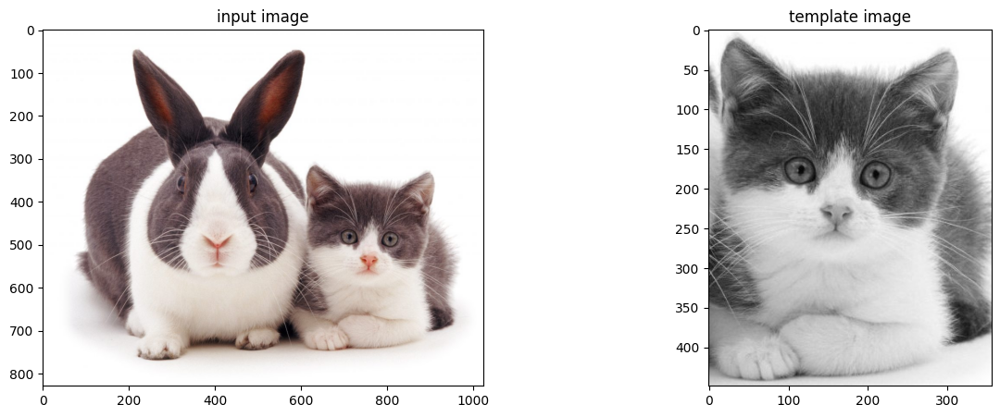

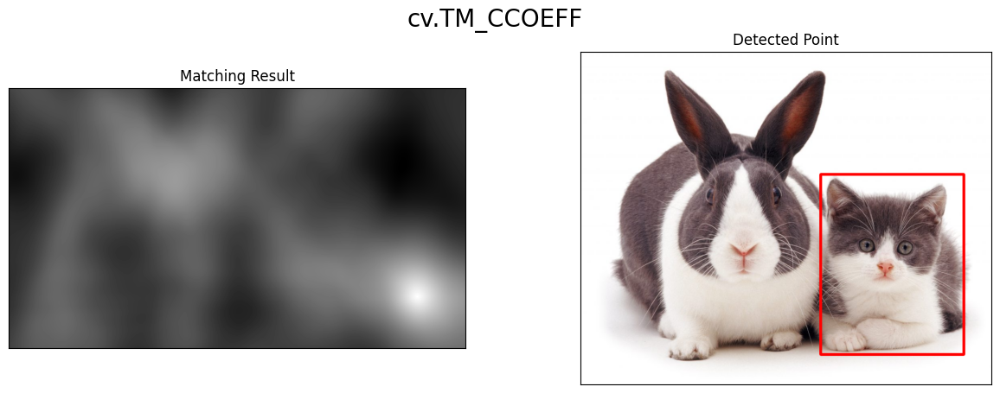

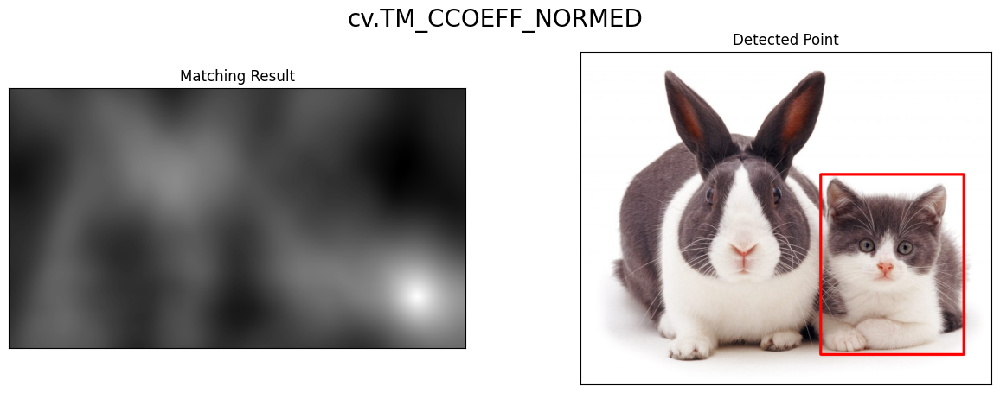

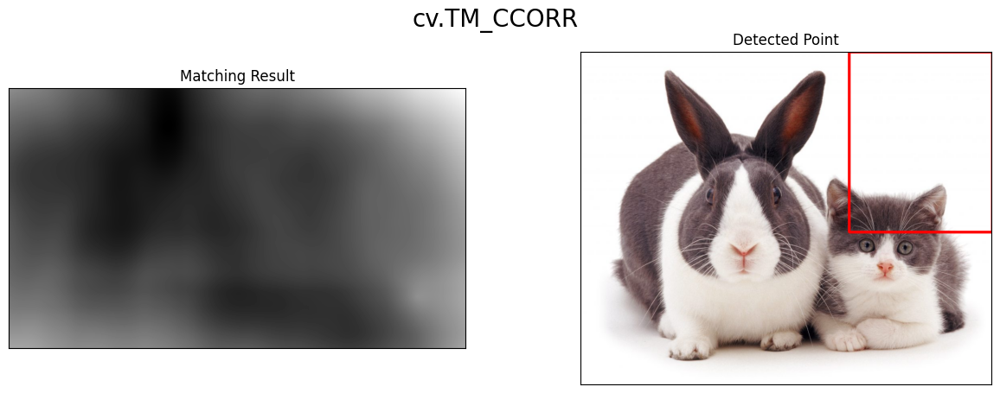

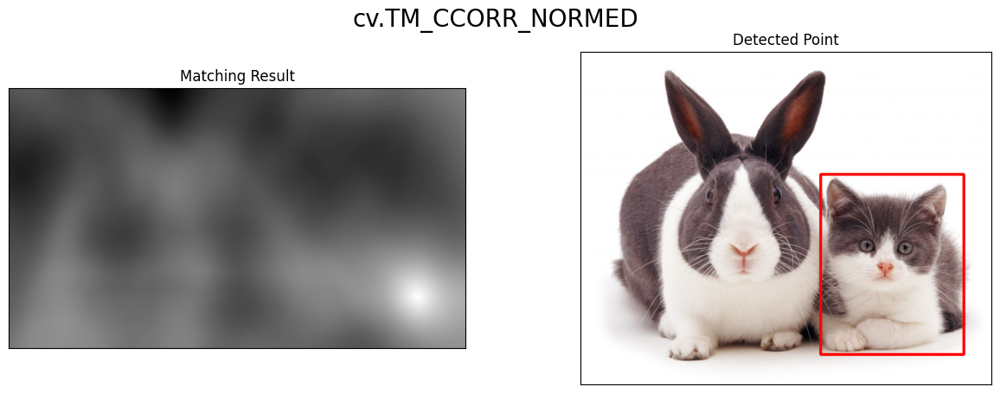

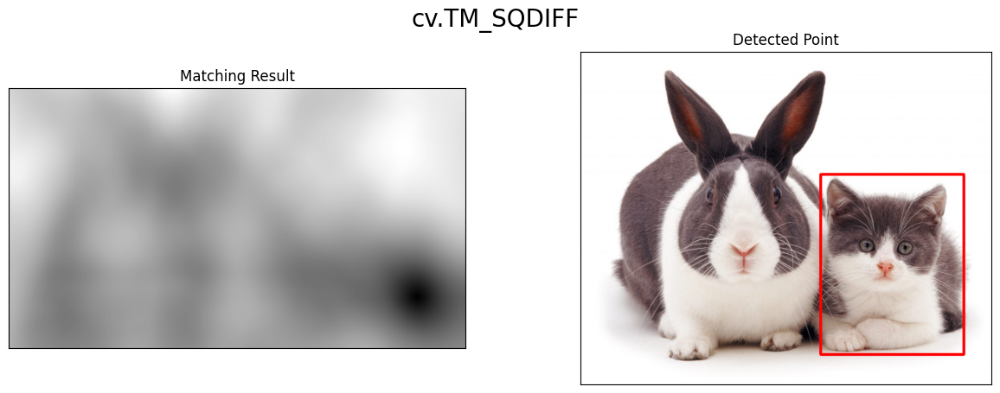

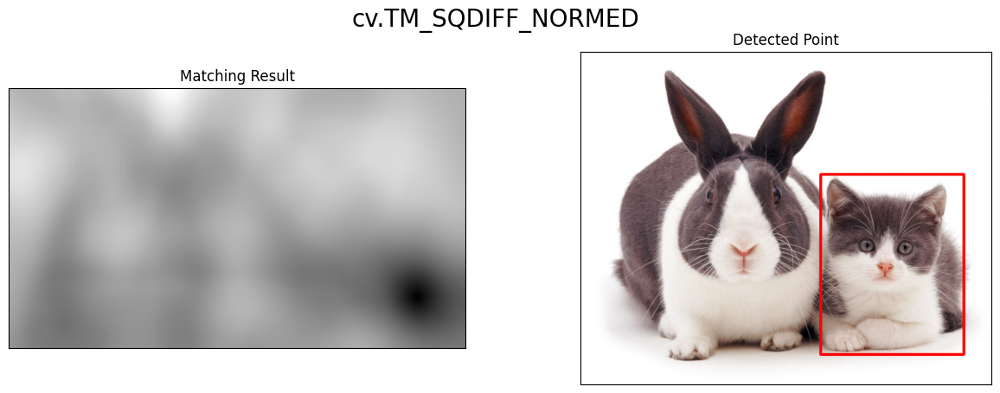

In [3]:
# load citra input
img = cv.imread('/content/drive/MyDrive/PCVK/img/cats_and_bunnies.jpg')
img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
img2 = img.copy()

#load citra template
template = cv.imread('/content/drive/MyDrive/PCVK/img/cat2_templatejpg.jpg',0)
# dimensi citra
w, h = template.shape[::-1]

# print input image dan template
f, axarr = plt. subplots(1,2,figsize=(15,5)) #membuat 2 plot untuk citra input dan template
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)), axarr[0].set_title("input image")
axarr[1].imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB)), axarr[1].set_title("template image")

# All the 6 methods for comparison in a list
methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

for meth in methods:
    img = img2.copy()
    method = eval(meth)
    # Apply template Matching
    res = cv.matchTemplate(img_gray,template,method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    thickness = 5  # Set the thickness of the rectangle
    cv.rectangle(img, top_left, bottom_right, (0, 0, 255), thickness)
    plt.figure(figsize=(15,5))
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    print("\n")
    plt.suptitle(meth, fontsize=20)
    plt.show()

### 3. Implementasikan konsep template matching tanpa menggunakan library OpenCV untuk multiple object, menggunakan gambar bahrain.jpg untuk citra masukan dan bahrain-template.jpg sebagai citra template, sehingga menghasilkan output sebagai berikut:


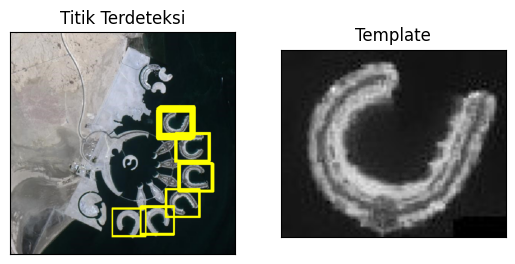

In [4]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img_rgb = cv.imread('/content/drive/MyDrive/PCVK/img/bahrain.jpg')
img_gray = cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)
template = cv.imread('/content/drive/MyDrive/PCVK/img/bahrain-template.jpg', cv.IMREAD_GRAYSCALE)

w, h = template.shape[::-1]
res = cv.matchTemplate(img_gray, template, cv.TM_CCOEFF_NORMED)
threshold = 0.43
loc = np.where(res >= threshold)

thickness = 1 # Set the thickness of the rectangle

# Gambar kotak untuk setiap deteksi dengan ketebalan yang sama
for pt in zip(*loc[::-1]):
    cv.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0, 255, 255), thickness)

fig, ax = plt.subplots(1, 2)
ax[0].imshow(cv.cvtColor(img_rgb, cv.COLOR_BGR2RGB))
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].set_title('Titik Terdeteksi')
ax[1].imshow(template, cmap='gray')
ax[1].set_title('Template')
ax[1].set_xticks([])
ax[1].set_yticks([])

plt.show()

### 4. Implementasikan metode Sobel Edge Detection, Canny Edge Detection, dan Laplacian Edge Detection pada OpenCV dengan menggunakan gambar car-park.jpg, sehingga menghasilkan luaran sebagai berikut:

## **a. Sobel Edge Detection**

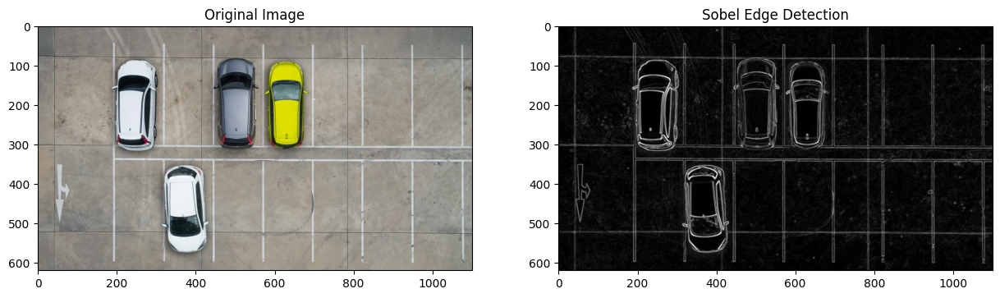

In [5]:
img0 = cv.imread('/content/drive/MyDrive/PCVK/img/car-park.jpg')

# converting to gray scale
gray = cv.cvtColor(img0, cv.COLOR_BGR2GRAY)

# remove noise
img = cv.GaussianBlur(gray, (3, 3), 0)

# obtaining a horizontal and vertical Sobel filtering of the image
img_sobelx = cv.Sobel(img, cv.CV_64F, 1, 0, ksize=3)
img_sobely = cv.Sobel(img, cv.CV_64F, 0, 1, ksize=3)

# image with both horizontal and vertical Sobel kernels applied
img_sobelxy = cv.addWeighted(cv.convertScaleAbs(img_sobelx), 0.5, cv.convertScaleAbs(img_sobely), 0.5, 0)

f, axarr = plt.subplots(1, 2, figsize=(15, 5))
axarr[0].imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
axarr[0].set_title("Original Image")
axarr[1].imshow(img_sobelxy, cmap='gray')
axarr[1].set_title("Sobel Edge Detection")
plt.show()

## **b. Canny Edge Detection**

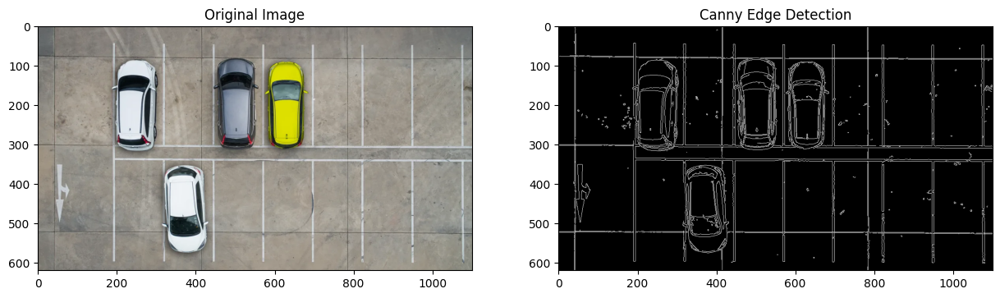

In [6]:
edged = cv.Canny(img0, 100, 200)

f, axarr = plt.subplots(1, 2, figsize=(15, 5))
axarr[0].imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
axarr[0].set_title("Original Image")
axarr[1].imshow(edged, cmap='gray')
axarr[1].set_title("Canny Edge Detection")
plt.show()

## **c. Laplacian Edge Detection**

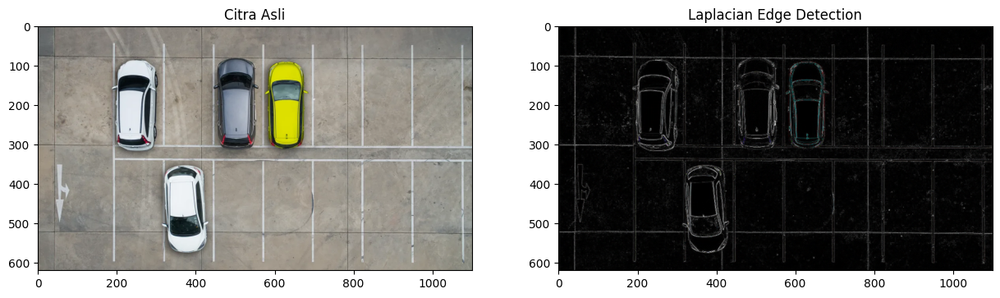

In [7]:
img = cv.imread('/content/drive/MyDrive/PCVK/img/car-park.jpg')

# Laplacian Edge Detection
laplacian = cv.Laplacian(img, cv.CV_64F)
laplacian = np.uint8(np.absolute(laplacian))

# Tampilkan gambar asli dan hasil Laplacian Edge Detection
f, axarr = plt.subplots(1, 2, figsize=(15, 5))
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
axarr[0].set_title("Citra Asli")
axarr[1].imshow(laplacian, cmap='gray')
axarr[1].set_title("Laplacian Edge Detection")
plt.show()

### 5.  Implementasikan metode Harris Corner Detection dan Shi-Tomasi Detection pada OpenCV dengan menggunakan gambar chess-board.jpg, sehingga menghasilkan luaran sebagai berikut:

## **a. Harris Corner Detection**


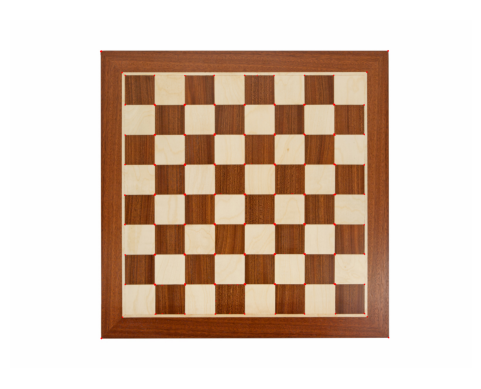

In [8]:
# Load citra input
input_img = cv.imread('/content/drive/MyDrive/PCVK/img/chess-board.jpg')
gray_img = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)
dst = cv.cornerHarris(gray_img, 3, 1, 0.04)

gray_img = np.float32(gray_img)
harris_output = cv.cornerHarris(gray_img, 2, 3, 3)
# Hasil harris corner dilakukan dilasi untuk menandai sudut
harris_output = cv.dilate(harris_output, None)

# Threshold untuk mengoptimalkan nilai
input_img[dst > 0.01 * dst.max()] = [0, 0, 255]

# Menampilkan gambar tanpa sumbu
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

## **b. Shi-Tomasi Detection**

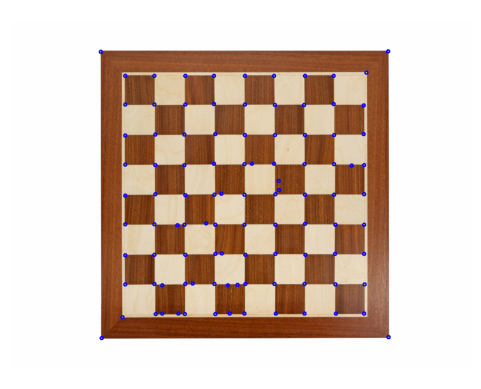

In [9]:
input_img = cv.imread('/content/drive/MyDrive/PCVK/img/chess-board.jpg')
gray_img = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)

corners = cv.goodFeaturesToTrack(gray_img, 100,0.01,10)
corners = np. int0(corners)
for i in corners:
    x,y = i.ravel()
    cv.circle(input_img, (x,y),3,255,2)

# Menampilkan gambar tanpa sumbu
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

### 6. Implementasikan metode Hough Transform pada OpenCV dengan menggunakan gambar sudoku.jpg. Tahapan proses grid detection sesuai yang terdapat pada ulasan teori, sehingga menghasilkan luaran sebagai berikut:

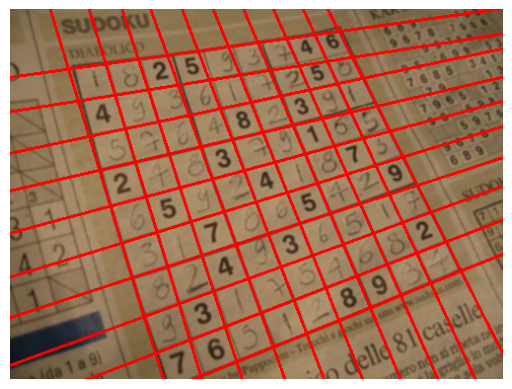

In [10]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

input_img = cv.imread('/content/drive/MyDrive/PCVK/img/sudoku.jpg')
img_gray = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)

edges = cv.Canny(img_gray, 90, 150, apertureSize=3)

kernel = np.ones((3, 3), np.uint8)
edges = cv.dilate(edges, kernel, iterations=1)

kernel = np.ones((5, 5), np.uint8)
edges = cv.erode(edges, kernel, iterations=1)

lines = cv.HoughLines(edges, 1, np.pi/180, 150)

if not lines.any():
    print('No lines were found')
    exit()

rho_threshold = 15
theta_threshold = 0.1

similar_lines = {i: [] for i in range(len(lines))}
for i in range(len(lines)):
    for j in range(len(lines)):
        if i == j:
            continue
        rho_i, theta_i = lines[i][0]
        rho_j, theta_j = lines[j][0]
        if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
            similar_lines[i].append(j)

indices = [i for i in range(len(lines))]
indices.sort(key=lambda x: len(similar_lines[x]))

line_flags = len(lines) * [True]
for i in range(len(lines) - 1):
    if not line_flags[indices[i]]:
        continue
    for j in range(i + 1, len(lines)):
        if not line_flags[indices[j]]:
            continue
        rho_i, theta_i = lines[indices[i]][0]
        rho_j, theta_j = lines[indices[j]][0]
        if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
            line_flags[indices[j]] = False

filtered_lines = [lines[i] for i in range(len(lines)) if line_flags[i]]

for line in filtered_lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000*(-b))
    y1 = int(y0 + 1000*(a))
    x2 = int(x0 - 1000*(-b))
    y2 = int(y0 - 1000*(a))

    cv.line(input_img, (x1, y1), (x2, y2), (0, 0, 255), 2)

# Tidak menampilkan informasi jumlah garis Hough
plt.axis('off')
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))
plt.show()

### 7. Implementasikan fungsi findContours() pada OpenCV untuk contour detection dengan menggunakan gambar laptop.jpg, sehingga menghasilkan luaran sebagai berikut:

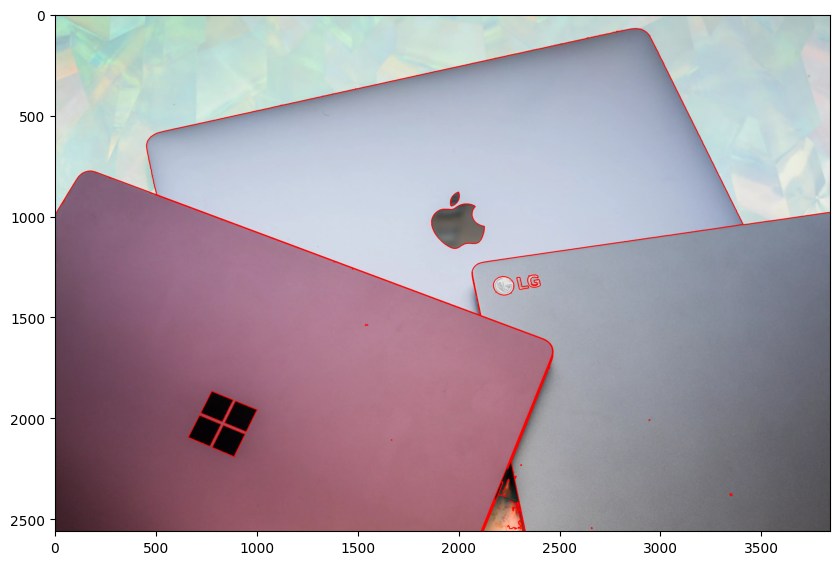

In [42]:
img = cv.imread('/content/drive/MyDrive/PCVK/img/laptop.jpg')
original_image = img.copy()

edged = cv2.Canny(img, 30, 200)
contours, hierarchy = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
cv2.drawContours(img, contours, -1, (0,0,255), 3)
plt.figure(figsize=(10,8))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

# **Pengayaan Materi KTP**

### 1.  Siapkan file dataset, contoh pada praktik ini menggunakan Maftuchin Tuban


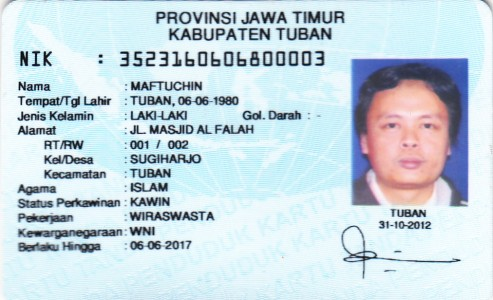

In [12]:
from google.colab.patches import cv2_imshow

# Load gambar KTP
ktp = cv.imread("/content/drive/MyDrive/PCVK/KTP/ktp4.png")

# Tampilkan gambar
cv2_imshow(ktp)

### 2.  Muat 2 library berikut sebagai tahapan persiapan

In [13]:
import cv2
import os

### 3.  Tambahkan kode lokalisasi dataset dan lakukan pembacaan file name di dalam direktori dataset tersebut

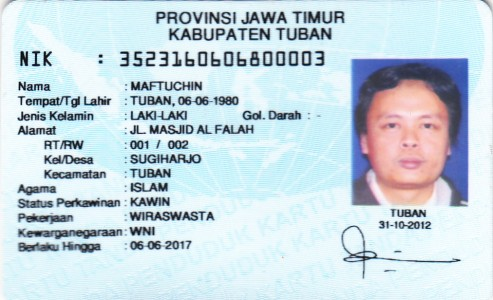

In [14]:
# Lokasi hasil pelat
path_plate = "/content/drive/MyDrive/PCVK/KTP/ktp4.png"

# Load gambar KTP
ktp = cv2.imread(path_plate)

# Tampilkan gambar
cv2_imshow(ktp)

# Variabel src
src = ktp.copy()

### 4.  Masih pada looping file direktori, terapkan Gaussian Blur untuk setiap file supaya noise pickle dapat direduksi

In [15]:
# Filtering (satu kali)
blurred = cv2.GaussianBlur(src, (5, 5), 0.5)

### 5.  Lakukan konversi grayscale untuk setiap hasil citra yang tereduksi noise dan lanjutkan dengan binerisasi citra (thresholding)

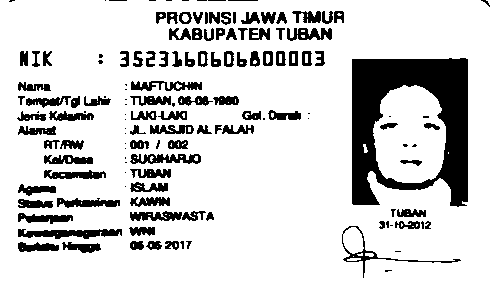

In [16]:
# Ubah ke grayscale
gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Tampilkan hasil filtering
cv2_imshow(bw)

### 6.  Terapkan morfologi untuk setiap citra yang telah mengalami binerisasi supaya setiap karakter atau obyek tidak berhimpitan.

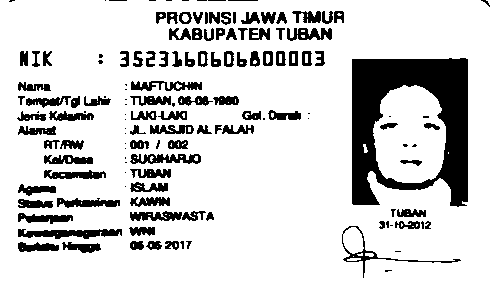

In [29]:
import numpy as np

# Operasi erosi
kernel = np.ones((1, 1), np.uint8)
erosion = cv2.erode(bw, kernel, iterations=1)
cv2_imshow(erosion)

### 7. Terapkan ekstraksi kontur untuk mendapatkan semua kontur setiap karakter/obyek. Kontur harus diseleksi berdasarkan ukuran dan rasio sebuah karakter. Karakter/obyek di dalam KTP ini bervariasi ukuran dan rasionya, sehingga setiap karakter/obyek perlu penanganan yang berbeda. Contoh pada praktik ini berfokus pada karakter yang seukuran dengan NIK. Jika hasil ekstraksi kontur memperlihatkan hasil lain yaitu karakter lain terdeteksi, hal tersebut wajar karena perlu optimize code dan preprocessing yang lebih baik (karena hasil akuisisi setiap citra dapat berbeda).


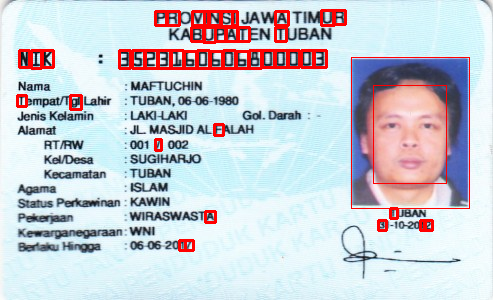

In [30]:
# Load gambar KTP
ktp = cv2.imread("/content/drive/MyDrive/PCVK/KTP/ktp4.png")

# Preprocessing
blurred = cv2.GaussianBlur(ktp, (5, 5), 0.5)
gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
erode = cv2.erode(bw.copy(), cv2.getStructuringElement(cv2.MORPH_OPEN, (1, 1)))

# Ekstraksi kontur
contours, hierarchy = cv2.findContours(erode.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

# Looping contours untuk mendapatkan kontur yang sesuai
for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 40 and w >= 10 and float(ras) <= 1:
        cv2.rectangle(ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 20 and w >= 5 and float(ras) <= 1:
        cv2.rectangle(ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)
    elif h >= 10 and w >= 5 and float(ras) <= 1:
        cv2.rectangle(ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)

cv2_imshow(ktp)

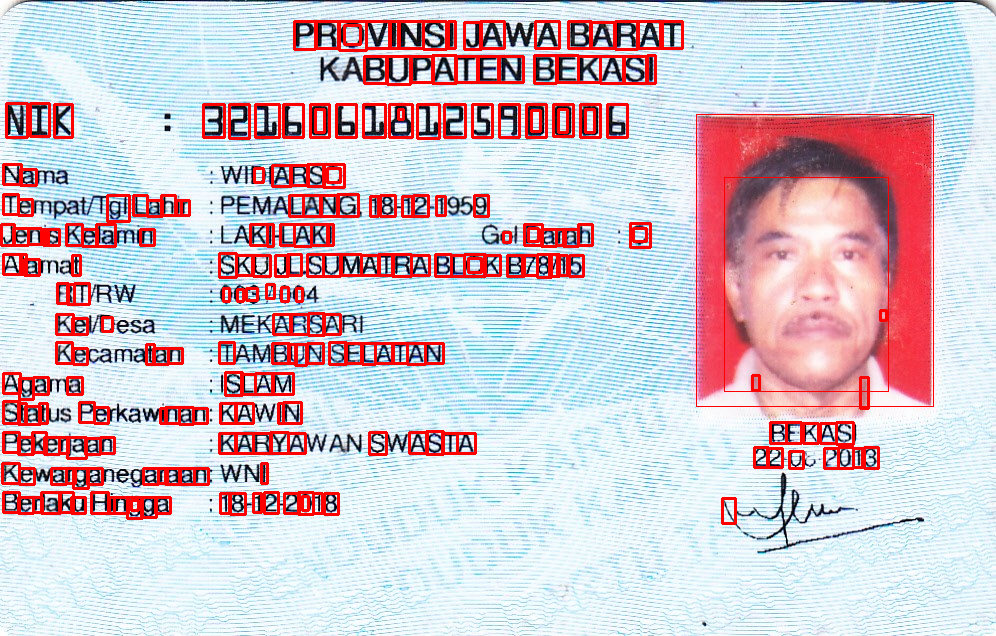

In [33]:
import cv2
from google.colab.patches import cv2_imshow

# Load gambar KTP
ktp = cv2.imread("/content/drive/MyDrive/PCVK/KTP/ktp6.png")

# Preprocessing
blurred = cv2.GaussianBlur(ktp, (5, 5), 0.5)
gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
ret, bw = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
erode = cv2.erode(bw, cv2.getStructuringElement(cv2.MORPH_OPEN, (1, 1)))

# Ekstraksi kontur
contours, hierarchy = cv2.findContours(erode.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

# Looping contours untuk mendapatkan kontur yang sesuai
for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 40 and w >= 10 and float(ras) <= 1:
        cv2.rectangle(ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 20 and w >= 5 and float(ras) <= 1:
        cv2.rectangle(ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)
    elif h >= 10 and w >= 5 and float(ras) <= 1:
        cv2.rectangle(ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)

cv2_imshow(ktp)

# **Tugas Praktikum**

Setiap citra memiliki karakteristik yang berbeda. Terapkan praktik pada materi pengayaan KTP untuk setiap dataset KTP yang tersedia. Perhatikan kondisi awal dataset, terapkan preprocessing yang sesuai jika kualitas visual citra kurang memadai untuk segera diolah. Pengerjaan dilakukan secara berkelompok dengan aturan sebagai berikut:

Kelompok 1 - KTP Riyanto Sleman

Kelompok 2 - KTP Galang Raka Bengkulu

Kelompok 3 - KTP Arief Wijaya Cimahi

**Kelompok 4 - KTP Edo Nias**

Kelompok 5 - KTP Widiarso Bekasi

Kelompok 6 - KTP Abdurrauf Soppeng


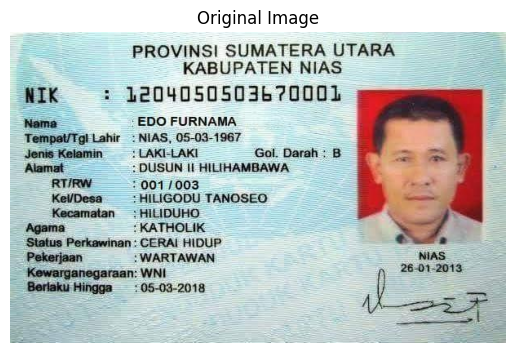

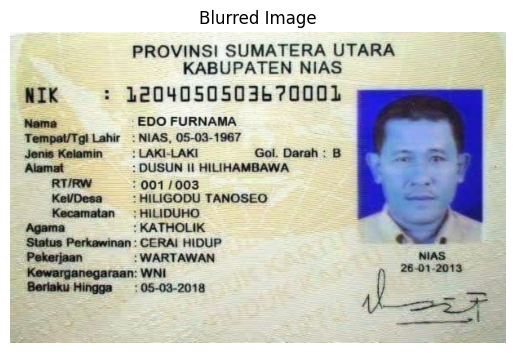

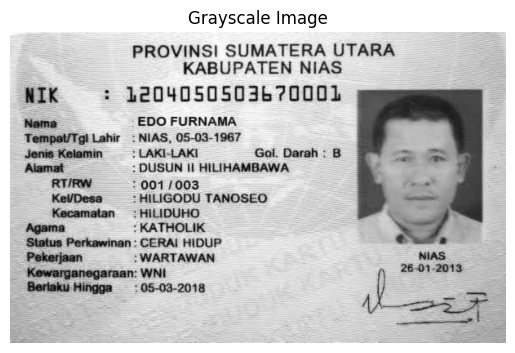

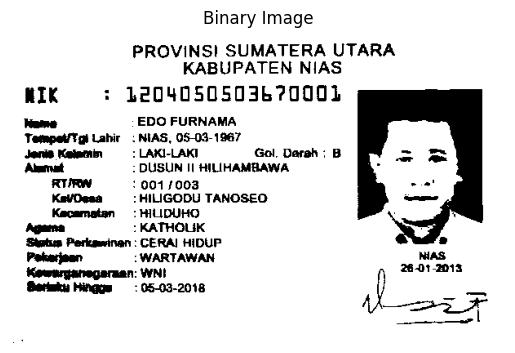

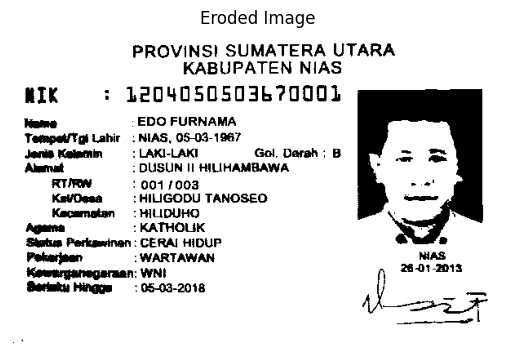

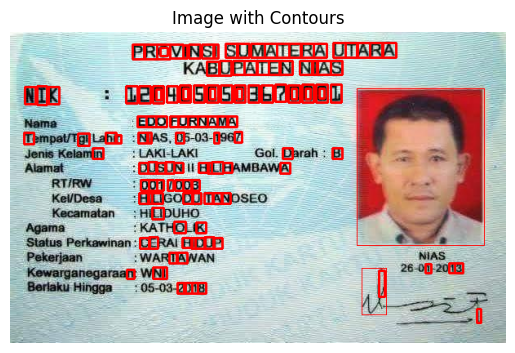

In [39]:
import cv2
import matplotlib.pyplot as plt

# Load gambar KTP
ktp = cv2.imread("/content/drive/MyDrive/PCVK/KTP/ktp5.png")

# Tampilkan gambar asli
plt.imshow(cv2.cvtColor(ktp, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')
plt.show()

# Preprocessing
original_image = ktp.copy()

# Tampilkan hasil Gaussian Blur
blurred_image = cv2.GaussianBlur(ktp, (5, 5), 0.5)
plt.imshow(blurred_image)
plt.title("Blurred Image")
plt.axis('off')
plt.show()

# Tampilkan citra grayscale
gray_image = cv2.cvtColor(blurred_image, cv2.COLOR_BGR2GRAY)
plt.imshow(gray_image, cmap='gray')
plt.title("Grayscale Image")
plt.axis('off')
plt.show()

# Tampilkan citra biner setelah thresholding
ret, binary_image = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
plt.imshow(binary_image, cmap='gray')
plt.title("Binary Image")
plt.axis('off')
plt.show()

# Tampilkan hasil erosi
eroded_image = cv2.erode(binary_image, cv2.getStructuringElement(cv2.MORPH_OPEN, (1, 1)))
plt.imshow(eroded_image, cmap='gray')
plt.title("Eroded Image")
plt.axis('off')
plt.show()

# Ekstraksi kontur
contours, hierarchy = cv2.findContours(eroded_image.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

# Gambar asli dengan kontur yang diextract ditampilkan
contour_image = ktp.copy()
for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 40 and w >= 10 and float(ras) <= 1:
        cv2.rectangle(contour_image, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 20 and w >= 5 and float(ras) <= 1:
        cv2.rectangle(contour_image, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)
    elif h >= 10 and w >= 5 and float(ras) <= 1:
        cv2.rectangle(contour_image, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)

# Tampilkan gambar dengan judul
plt.imshow(cv2.cvtColor(contour_image, cv2.COLOR_BGR2RGB))
plt.title("Image with Contours")
plt.axis('off')
plt.show()

In [43]:
!pip install pytesseract
!sudo apt-get install tesseract-ocr-ind

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-ind tesseract-ocr-osd
0 upgraded, 4 newly installed, 0 to remove and 19 not upgraded.
Need to get 5,353 kB of archives.
After this operation, 16.8 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Get:4 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-ind all 1:4.00~git30-7274cfa-1.1 [537 kB]
Fetched 5,353 kB in 3s (1,948 kB/s)
debconf: unable to ini

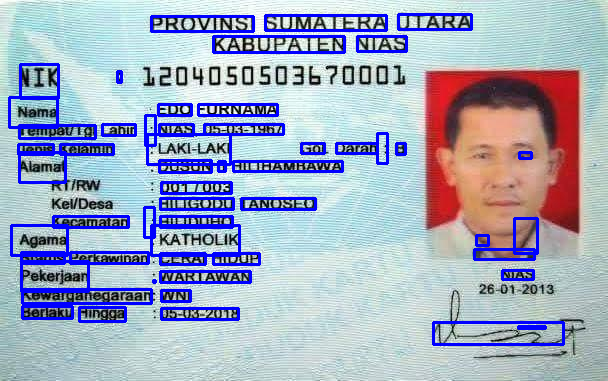

Extracted Text:
PROVINSI SUMATERA UTARA
KABUPATEN NIAS

NIK 1 12010505036?70001

 

Nama EDO FURNAMA
Tempat/Tgl Lahir : NIAS, 05-03-1967
Jenis Kelamin LAKI-LAKI Gol. Darah : B aa
Alamat 1 DUSUN II HILIHAMBAWA

RTIRW 001/003

Kel/Desa HILIGODU TANOSEO

Kecamatan : HILIDUHO
Agama KATHOLIK » 1
Status Perkawinan : CERAI HIDUP rada
Pekerjaan : WARTAWAN NIAS
Kewarganegaraan: WNI Na 2oA ai
Berlaku Hingga — :05-03-2018 li

AS



In [53]:
import pytesseract
from pytesseract import Output
from PIL import Image
from IPython.display import display

# Load image
ktp_image = cv2.imread('/content/drive/MyDrive/PCVK/KTP/ktp5.png')

# Convert to RGB (OpenCV uses BGR by default)
ktp_image_rgb = cv2.cvtColor(ktp_image, cv2.COLOR_BGR2RGB)

# Denoise the image
ktp_denoised = cv2.fastNlMeansDenoisingColored(ktp_image, None, h=7)

# Convert to grayscale
ktp_image_gray = cv2.cvtColor(ktp_denoised, cv2.COLOR_RGB2GRAY)

# Perform OCR on the thresholded image
ret, threshed = cv2.threshold(ktp_image_gray, 127, 255, cv2.THRESH_TRUNC)
text_data = pytesseract.image_to_data(threshed, output_type=Output.DICT)

# Draw rectangles around the detected text
for i in range(len(text_data['text'])):
    if int(text_data['conf'][i]) > 20:
        (x, y, w, h) = (text_data['left'][i], text_data['top'][i], text_data['width'][i], text_data['height'][i])
        cv2.rectangle(ktp_image_rgb, (x, y), (x + w, y + h), (0, 0, 255), 2)

# Display the image with rectangles
display(Image.fromarray(ktp_image_rgb))

# Extracted text
extracted_text = pytesseract.image_to_string(threshed, lang="ind")
print("Extracted Text:")
print(extracted_text)